# California Housing Project 

Author: Shuai Meng (shuaim@seas.upenn.edu)

In this project, two main aspects of data were discussed:
1. EDA analysis compares the relationship between housing prices and the age, income, geographic location and population of the population in the area, and gives reasonable assumptions
2. K-means clustering is used to classify all the characteristics of the area, mainly housing prices, income, etc., and to analyze what characteristics each category has, and finally to give an evaluation of the clustering results.
3. We use a stratified sampling method to divide the dataset into testing set and a training set, and combine seven machine learning methods for accuracy prediction, and select the best model for gridsearch hyperparameter tuning.

In [1]:
#This jupyter notebook is created to analyse California state housing information.
import numpy as np
import pandas as pd
import random
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.pyplot as mp
import matplotlib.style as style
import seaborn as sns
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from matplotlib.colors import ListedColormap
import os
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
import scipy.stats as stats
from scipy.stats import norm
import matplotlib.gridspec as gridspec 

from sklearn.linear_model import LinearRegression, RidgeCV
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor

In [2]:
# Set the path to save images
PROJECT_ROOT_DIR = "."
IMAGE_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGE_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True): # as long as you run this function, you could save the figure into your folder
    '''
    Run to save automatic pictures
    
    :param fig_id: figure name
    '''
    path = os.path.join(PROJECT_ROOT_DIR, "images", fig_id + ".png")
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format='png', dpi=300)
    
# ignore the warning(Scipy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", category=FutureWarning, module='sklearn',  lineno=196)

In [3]:
housing = pd.read_csv('housing.csv')
anscombe = pd.read_csv('anscombe.csv')

# Exploratory Data Analysis

## 1. Data Wrangling and Cleaning

In [4]:
housing.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


The text file of dataset was read into a dataframe("housing") as shown in the table above. The dataframe contains the follow columns:

1. longitude: A measure of how far west a house is; a higher value is farther west
2. latitude: A measure of how far north a house is; a higher value is farther north
3. housing_median_age: Median age of a house within a block; a lower number is a newer building
4. total_rooms: Total number of rooms within a block
5. population: Total number of people residing within a block
6. households: Total number of households, a group of people residing within a home unit, for a block
7. median_income: Median income for households within a block of houses (measured in tens of thousands of US Dollars)
8. median_house_value: Median house value for households within a block (measured in US Dollars)
9. ocean_proximity: Location of the house with respect to ocean/sea

I first check the data type of every columns of the housing dataframe and find out if there exists any missing value among these columns. It seems that total_bedrooms column has the missing value. I can fill the missing data with the fillna method based on the average of neighboring elements.

In [5]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


housing.describe() shows the basic numerical feature of the housing dataframe (average, standard deviations...)

In [6]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [7]:
housing.isnull().any() 

longitude             False
latitude              False
housing_median_age    False
total_rooms           False
total_bedrooms         True
population            False
households            False
median_income         False
median_house_value    False
ocean_proximity       False
dtype: bool

In [8]:
# I can fill the missing data with the fillna method based on the average of neighboring elements.
housing = housing.fillna(housing.mean())
housing.isnull().any() 

longitude             False
latitude              False
housing_median_age    False
total_rooms           False
total_bedrooms        False
population            False
households            False
median_income         False
median_house_value    False
ocean_proximity       False
dtype: bool

since 'ocean_proximity' is the categorical feature of the data, I will have a look at how many unique types of this feature. It has a total of five types of classification: 'NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', and 'ISLAND'.

In [9]:
housing.ocean_proximity.value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

I also turn the non-numerical features into the numerical features (use pd.get_dummies), which is useful for the subsequent machine learning problem solving. 

In [10]:
new_col = pd.get_dummies(housing.ocean_proximity)
housing[new_col.columns] = new_col
housing.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,0,0,0,1,0


## 2. Data Exploration and Visualization  

In [11]:
font3 = {'family' : 'Times New Roman', 'weight' : 'normal', 'size' : 20}

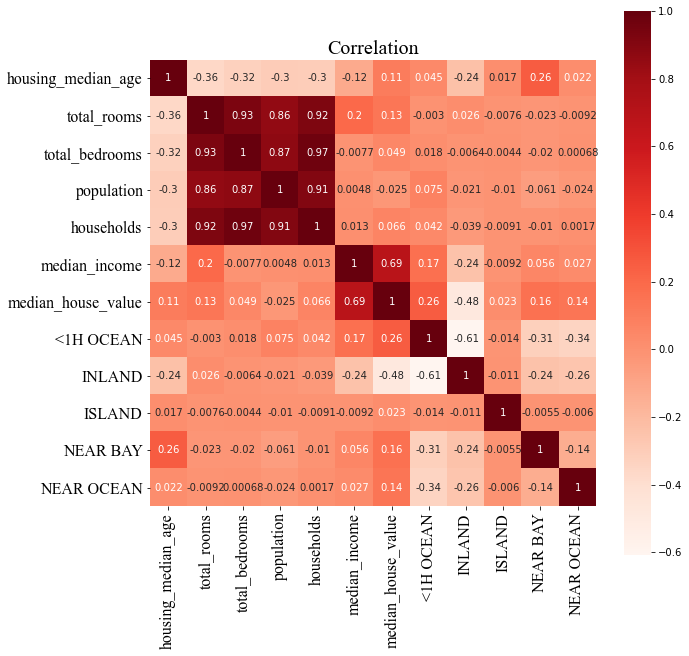

In [12]:
# correlation heat map
dfData = housing[['housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value','<1H OCEAN','INLAND','ISLAND','NEAR BAY','NEAR OCEAN']].corr()
plt.subplots(figsize=(10, 10)) # set the figure size
sns.heatmap(dfData, annot=True, vmax=1, square=True, cmap="Reds")
plt.yticks(fontsize =16, fontname = 'Times New Roman') 
plt.xticks(fontsize =16, fontname = 'Times New Roman') 
plt.title('Correlation', font3)
plt.show()

In [13]:
housing['total_income'] = housing['population'] * housing['median_income'] 
housing[['median_house_value','total_income']].corr()

,median_house_value,total_income
median_house_value,1.000000,0.276269
total_income,0.276269,1.000000


In [14]:
housing['total_house_price'] = housing['households'] * housing['median_house_value'] 
housing[['total_house_price','total_income']].corr()

,total_house_price,total_income
total_house_price,1.000000,0.764716
total_income,0.764716,1.000000


In [15]:
#groupby based on location of the house. Investigate if different area makes difference on those features in the dataframe.
housing.drop(['latitude','longitude','<1H OCEAN','INLAND','ISLAND','NEAR BAY','NEAR OCEAN'],axis = 1).groupby('ocean_proximity').mean()

,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,total_income,total_house_price
ocean_proximity,,,,,,,,,
<1H OCEAN,29.279225,2628.343586,546.442403,1520.290499,517.744965,4.230682,240084.285464,6283.248185,1.261240e+08
INLAND,24.271867,2717.742787,533.915109,1391.046252,477.447565,3.208996,124805.392001,4654.481996,6.164140e+07
ISLAND,42.400000,1574.600000,420.400000,668.000000,276.600000,2.744420,380440.000000,1847.879980,1.071646e+08
NEAR BAY,37.730131,2493.589520,514.389699,1230.317467,488.616157,4.172885,259212.311790,5151.655509,1.309205e+08
NEAR OCEAN,29.347254,2583.700903,538.607267,1354.008653,501.244545,4.005785,249433.977427,5415.775492,1.265298e+08


I first plot the correlation heat map in order to get an intuition of the inner connection of features in the dataframe and we can also have a clearer grasp of which characteristics have the most significant impact on our house prices in the later house price prediction section. From the figure above, it can be dereived that the median house price is proportional to the median income of local residents with a correlation of 0.69. This is actually obvious to justify because the wealthier the community is, the more people can afford to pay high house prices. 

However, when it comes to the coefficient between the total income of a certain region and the corresponding median house price, an interesting phenomenon comes up: the correlation coefficient between the two features is only 0.27, which is somewhat insignificant compared to the correlation coefficient of 0.69. The main reason for this is that the total house price would also be affected by the population of a region. A specific area with a higher house price and higher income community may lead to the fact that fewer people is likely to live in here. Therefore, the total income may not show an obvious correlation to the house price, which is also evidenced in the distribution map below.

Besides, it seems that house prices also have something to do with location, as those houses close to the ocean (or on the island) are generally more expensive than those inland. The median house price peaked at 380,440 dollars, even three times greater than the inland house price (124,805 dollars). Some other information obtained here is that the number of households is not 100% correlated with population, because the averaged size of household has to be taken  into considerations. 

In [16]:
housing.loc[housing['housing_median_age'] <= 30, 'equal_or_lower_than_30?'] = 'True' 
housing.loc[housing['housing_median_age'] > 30, 'equal_or_lower_than_30?'] = 'False' 

In [17]:
# In this step, we want to investigate the connection between age(greater than 30 or not) with the house price and income.
housing.drop(['latitude','longitude','<1H OCEAN','INLAND','ISLAND','NEAR BAY','NEAR OCEAN'],axis = 1).groupby('equal_or_lower_than_30?').mean()


,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,total_income,total_house_price
equal_or_lower_than_30?,,,,,,,,,
False,40.022117,1928.157662,412.178823,1125.308689,390.101106,3.687665,215771.215377,3991.872660,8.785351e+07
True,18.942037,3238.608614,644.953816,1681.205384,592.776043,4.026584,199260.329385,6836.617124,1.218997e+08


This part of the analysis is mainly a discussion of the effect of age on other features. I mainly divided the age into two groups, one is the age group older than 30, and the other part is the age younger than 30. From the above dataframe, it can be obtained that the two groups are more representative of the age of 40 and 18, where the actual median income of the older group is not as high as that of the younger group (3.68 vs. 4.02), but the house they purchased has a higher value. The specific reason for this may be that older people may have their own savings in addition to income, so they can more easily afford more expensive houses. Younger people may not like to live in one place for a long time due to job switch and other reasons, so they will not buy too expensive houses.

For our subsequent look at the data, it'd be smart to plot some histograms and see how the values range across the column categories:

In [18]:
housing.drop(['equal_or_lower_than_30?'],axis=1,inplace=True)

In [19]:
housing.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,total_income,total_house_price
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0,0,0,1,0,2680.7144,57027600.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0,0,0,1,0,19931.6614,407973000.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0,0,0,1,0,3599.6704,62321700.0


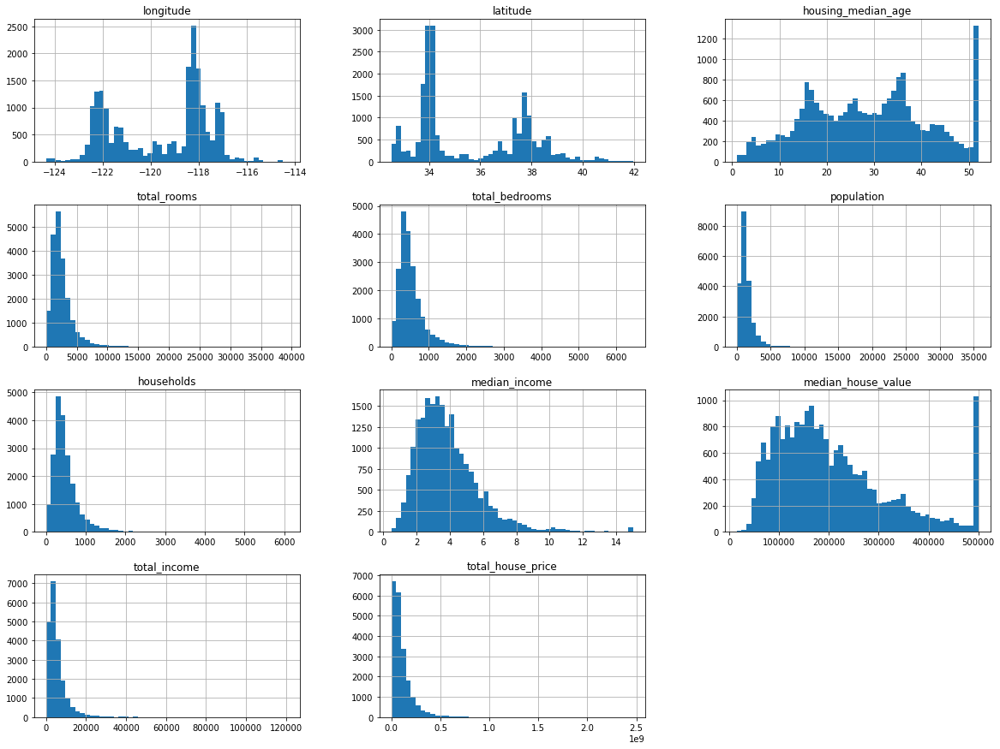

In [20]:
house_plot = housing.drop(['ocean_proximity','<1H OCEAN','INLAND','ISLAND','NEAR BAY','NEAR OCEAN'],axis=1)
house_plot.hist(bins=50, figsize=(20,15))
plt.show()

On the basis of the above figures, we can see two issues which would probably hamper our results and the accuracy of analysis: the range of values recorded for the median age of the houses and for the median house value was capped at 50 years and 500,000 respectively. All the houses more than 500,000 and people aged more than 50 years would be counted as 50 years and 500,000.

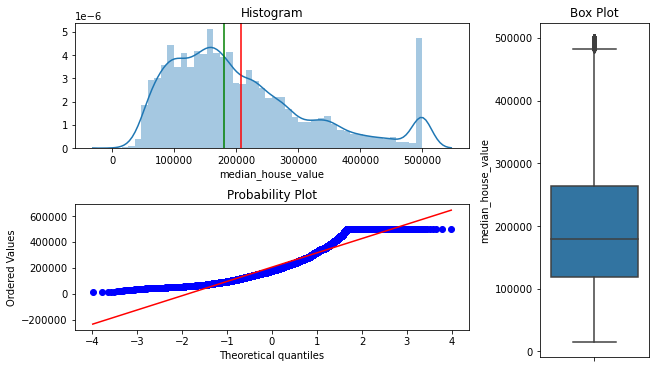

In [21]:
def three_chart_plot(df, feature):
    fig = plt.figure(constrained_layout = True, figsize = (9, 5))
    grid = gridspec.GridSpec(ncols = 3, nrows = 3, figure = fig)
    
    ax1 = fig.add_subplot(grid[0, :2])
    ax1.set_title('Histogram')
    
    sns.distplot(df.loc[:, feature], norm_hist = True, ax = ax1)
    plt.axvline(x = df[feature].mean(), c = 'red')
    plt.axvline(x = df[feature].median(), c = 'green')
    
    ax2 = fig.add_subplot(grid[1, :2])
    ax2.set_title('QQ_plot')
    stats.probplot(df.loc[:,feature], plot = ax2)

    # Customizing the Box Plot. 
    ax3 = fig.add_subplot(grid[:, 2])
    # Set title. 
    ax3.set_title('Box Plot')
    sns.boxplot(df.loc[:,feature], orient = 'v', ax = ax3 )
    
three_chart_plot(housing, 'median_house_value')

Red line in histogram indicates the mean of the SalePrice and the Green line indicates the median. From the above plots, we can observe that the Sales Price is not normally distributed. From the boxplot we can observe that the dataset have a number of outliers.

For the probability plot, the red line represents those points which would have been plotted for y-axis points if those were normally distributed. But the blue points represents the actual scenario. We can see that there is a lot of deviation on the both the ends i.e on the top right and bottom left.

In [22]:
from scipy.stats import skew
print("Skewness of the SalesPrice is", housing['median_house_value'].skew())

Skewness of the SalesPrice is 0.9777632739098341


Skewness refers to the amount of asymmetry in the given feature or in other words amount of distortions from the normal distribution.

Here we can observe that the value of skewness is quite high which means that there is a large amount of asymmetry. As the mean of the feature is greater than the median which is greater than the mode and the line is flat towards the right in the histogram, the given feature is Positively Skewed. Most of the houses were sold less than the average price.

In the next step, I try to utilize log(1+n) transformation to make it more normal:

In [23]:
housing['median_house_value_log']=np.log1p(housing['median_house_value'])

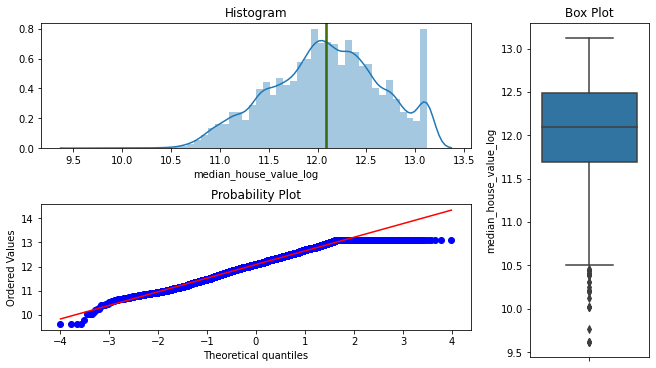

In [24]:
three_chart_plot(housing, 'median_house_value_log')

This graph looks much better, the only non-normal parts are clipped high prices and very low prices. Unfortunately we can not reconstruct clipped data, but predicting of target_log instead of target can be a good choice for us

In [25]:
housing.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,total_income,total_house_price,median_house_value_log
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,0,0,0,1,0,2680.7144,57027600.0,13.022766
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,0,0,0,1,0,19931.6614,407973000.0,12.789687
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,0,0,0,1,0,3599.6704,62321700.0,12.771673


In [270]:
# This section is the MATLAB code. Because I plot the geographic boundary in MATLAB software.

# %% read the data 
# data = csvread('housing2.csv'); 
# %% read the administrative area
# a = m_shaperead('ne_50m_admin_1_states_provinces');
# lon = data(:,1);
# lat = data(:,2);

# % age
# d = data(:,3);
# c = d; 
# %subplot(2,2,1)
# m_proj('Transverse Mercator','lon',[-125,-114],'lat',[32,42.5]);
# hold on;
# m_coast('patch',[253/255 245/255 230/255],'linewidth',1,'edgecolor',[243/255 233/255 210/255]);
# m_grid('tickdir','out','backgroundcolor',[235/255 255/255 255/255],'linewidth',1,'linecolor',[0.8 0.8 0.8],'fontsize',15,'fontname','Times New Roman');
# for k=1:length(a.ncst)
#     m_line(a.ncst{k}(:,1),a.ncst{k}(:,2),'linewidth',1.2,'color',[0.7 0.7 0.7]); 
# end
# %m_plotbndry('states','color','r');
# m_scatter(lon,lat,12,c,'filled');
# colorbar('fontsize',15,'fontname','Times New Roman');
# colormap('cool');
# caxis([0 58]); 
# title('Distribution of Housing Median Age','FontSize',18,'fontname','Times New Roman');

# % population
# d = data(:,6);
# c = d; 
# %subplot(2,2,1)
# m_proj('Transverse Mercator','lon',[-125,-114],'lat',[32,42.5]);
# hold on;
# m_coast('patch',[253/255 245/255 230/255],'linewidth',1,'edgecolor',[243/255 233/255 210/255]);
# m_grid('tickdir','out','backgroundcolor',[235/255 255/255 255/255],'linewidth',1,'linecolor',[0.8 0.8 0.8],'fontsize',15,'fontname','Times New Roman');
# for k=1:length(a.ncst)
#      m_line(a.ncst{k}(:,1),a.ncst{k}(:,2),'linewidth',1.2,'color',[0.7 0.7 0.7]); 
# end
# m_scatter(lon,lat,12,c,'filled');
# colorbar('fontsize',15,'fontname','Times New Roman');
# colormap('cool');
# caxis([0 2332]); 
# title('Distribution of Population','FontSize',18,'fontname','Times New Roman');

# % median_income
# d = data(:,8);
# c = d; 
# %subplot(2,2,1)
# m_proj('Transverse Mercator','lon',[-125,-114],'lat',[32,42.5]);
# hold on;
# m_coast('patch',[253/255 245/255 230/255],'linewidth',1,'edgecolor',[243/255 233/255 210/255]);
# m_grid('tickdir','out','backgroundcolor',[235/255 255/255 255/255],'linewidth',1,'linecolor',[0.8 0.8 0.8],'fontsize',15,'fontname','Times New Roman');
# for k=1:length(a.ncst)
#      m_line(a.ncst{k}(:,1),a.ncst{k}(:,2),'linewidth',1.2,'color',[0.7 0.7 0.7]); 
# end
# m_scatter(lon,lat,12,c,'filled');
# colorbar('fontsize',15,'fontname','Times New Roman');
# colormap('cool');
# caxis([0 7]);
# title('Distribution of Median Income','FontSize',18,'fontname','Times New Roman');

# % median_house_value
# d = data(:,9);
# c = d; 
# %subplot(2,2,1)
# m_proj('Transverse Mercator','lon',[-125,-114],'lat',[32,42.5]);
# hold on;
# m_coast('patch',[253/255 245/255 230/255],'linewidth',1,'edgecolor',[243/255 233/255 210/255]);
# m_grid('tickdir','out','backgroundcolor',[235/255 255/255 255/255],'linewidth',1,'linecolor',[0.8 0.8 0.8],'fontsize',15,'fontname','Times New Roman');
# for k=1:length(a.ncst)
#      m_line(a.ncst{k}(:,1),a.ncst{k}(:,2),'linewidth',1.2,'color',[0.7 0.7 0.7]); 
# end
# m_scatter(lon,lat,12,c,'filled');
# colorbar('fontsize',15,'fontname','Times New Roman');
# colormap('cool');
# caxis([0 359400]); 
# title('Distribution of Median House Value','FontSize',18,'fontname','Times New Roman');

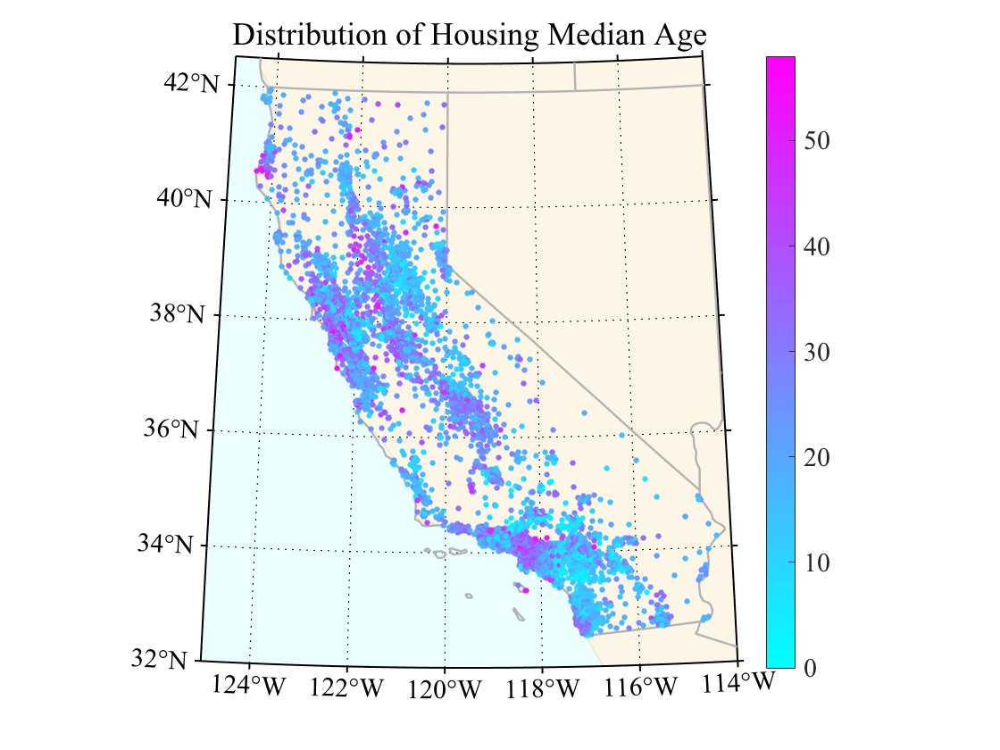

In [26]:
from IPython.display import Image
Image(filename = "dist_age.png", width = 500, height = 200)

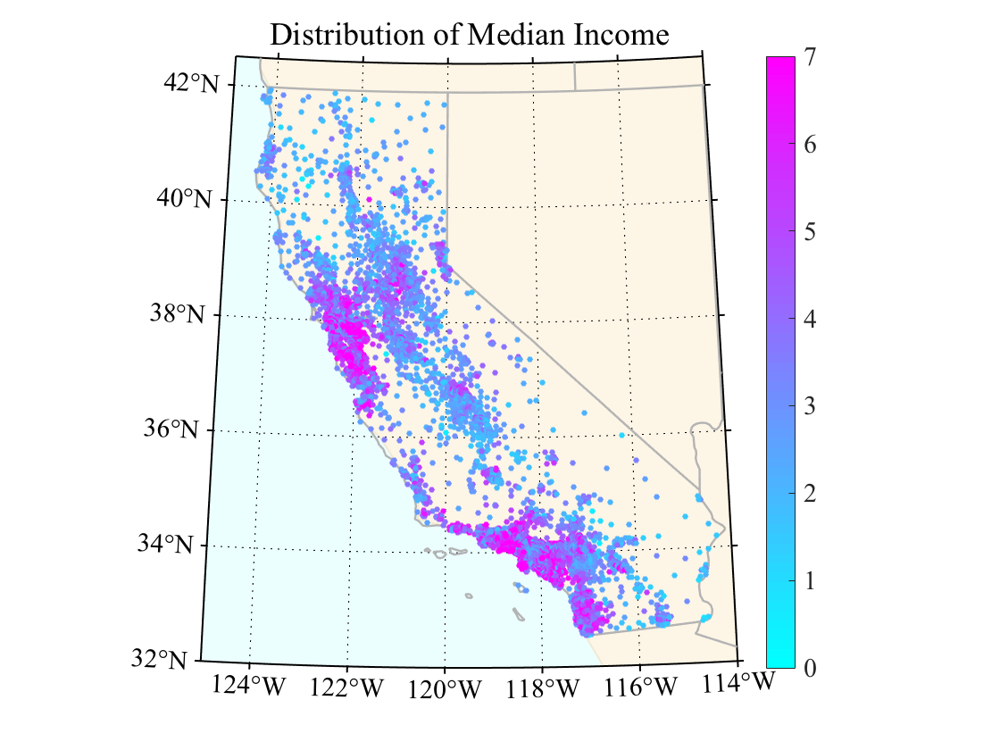

In [27]:
from IPython.display import Image
Image(filename = "dist_incom.png", width = 500, height = 200)

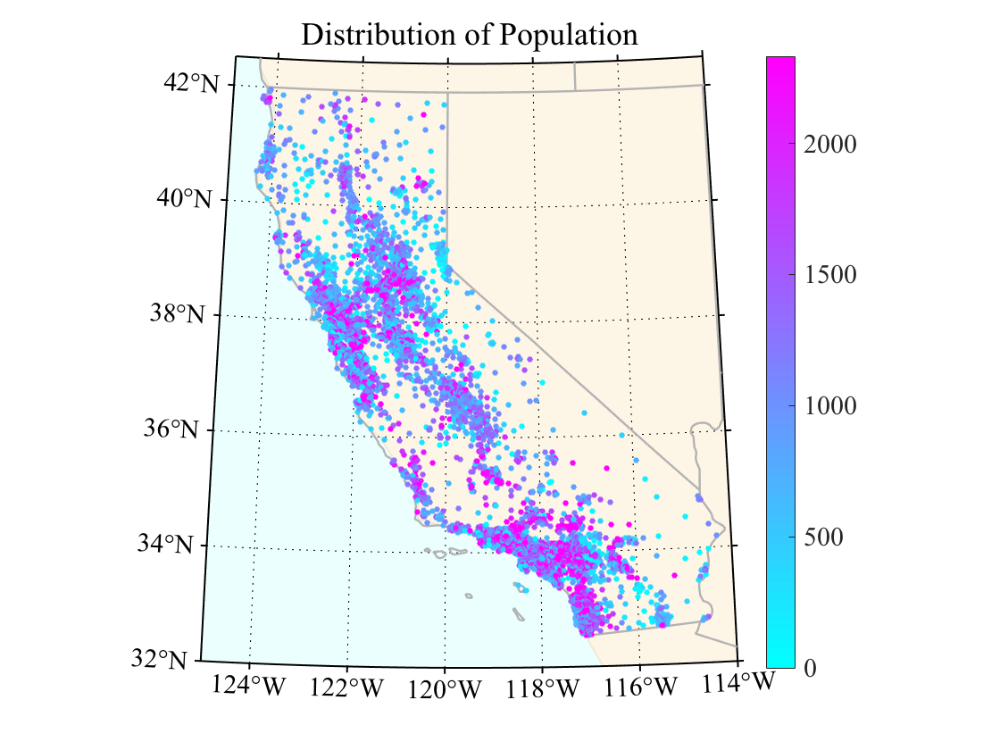

In [28]:
from IPython.display import Image
Image(filename = "dist_pop.png", width = 500, height = 200)

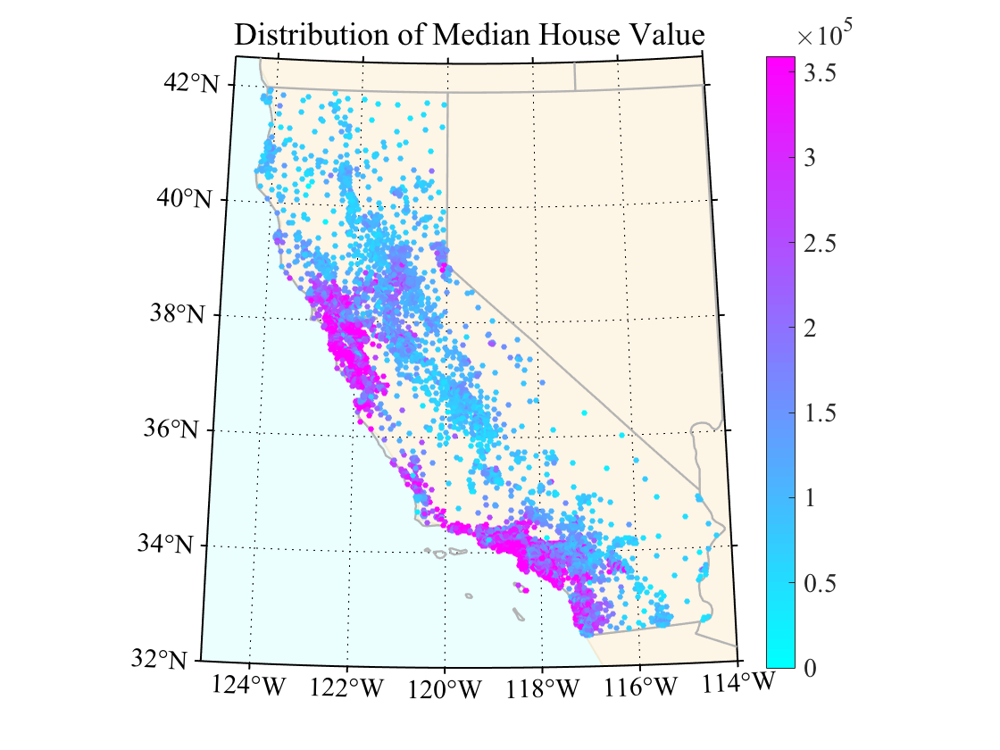

In [29]:
from IPython.display import Image
Image(filename = "dist_value.png", width = 500, height = 200)

In this section, I plot the distribution of median house value, median age, median income, and population with respect to geographic location. Since I want to have a more precise administrative boundary, the mmap package of MATLAB software is used to implement this part of the code. First of all, the distribution in the graph confirms some of our previous conclusions: the house price is closely related to the median income; The higher the income is, the higher the house price will be; Proximity to the ocean indicates a higher price; The population distribution is not the most along the sea shore but relatively evenly distributed.

In addition, I also found several other interesting points: the location of the selected houses is distributed in a band pattern; the population distribution is generally larger in the south than in the north, while the age is generally larger in the north than in the south; there are still communities with really high prices but located in the inland area, which shows that the proximity to the sea is not the only factor affecting the price of houses.

# K-Means Clustering

In this section, I will use unsupervised machine learning method: K-means cluster to group by all the features mentioned in the dataframe and explore if we could get any inspirations from that.

In [26]:
# number of samples and features
n_samples, n_features = housing.shape
# 
#n_labels = len(np.unique(labels))
housing_cluster = housing.drop(['ocean_proximity','total_income','total_house_price','median_house_value_log'],axis=1)
housing_cluster.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,0,0,0,1,0


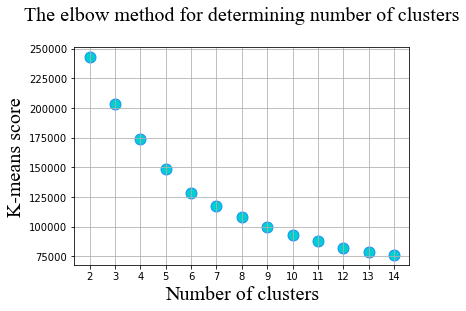

Saving figure elbow method for K-means Cluster


<Figure size 432x288 with 0 Axes>

In [27]:
# firstly I plot the elbow graph to determine the number of cluster:
scaler = StandardScaler()
housing_cluster_scaled = scaler.fit_transform(housing_cluster)
km_scores= []

for i in range(2,15):
    km = KMeans(n_clusters=i, random_state=0).fit(housing_cluster_scaled)
    preds = km.predict(housing_cluster_scaled)
    km_scores.append(-km.score(housing_cluster_scaled))

plt.title("The elbow method for determining number of clusters\n",font3)
plt.scatter(x=[i for i in range(2,15)],y=km_scores,s=120,c='#00CED1',edgecolor='#1E90FF')
plt.grid(True)
plt.xlabel("Number of clusters",font3)
plt.ylabel("K-means score",font3)
plt.xticks([i for i in range(2,15)])
plt.show()
save_fig("elbow method for K-means Cluster")

In cluster analysis, the elbow method is a heuristic used in determining the number of clusters in a data set. The method consists of plotting the explained variation as a function of the number of clusters, and picking the elbow of the curve as the number of clusters to use. In this section, I use the K-means score to represent the explained variation. From the above figure, it makes sense if we set the number of cluster to be 3,4 or 5. I would compare performance with different number of clusters later.

In [28]:
# cluster for standarized data
housing_cluster_scaled = pd.DataFrame(housing_cluster_scaled)
pca = PCA(n_components=2)
housing_PCA_scaled = pca.fit_transform(housing_cluster_scaled)
n_clusters = 5
# Use k-means for clustering, set cluster=5, set different initialization methods ('k-means++' and 'random')
km1 = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
km2 = KMeans(init='random', n_clusters=5, n_init=10, random_state=42)
# also use the cluster = 3
km3 = KMeans(init='k-means++', n_clusters=3, n_init=10, random_state=42)
km4 = KMeans(init='random', n_clusters=3, n_init=10, random_state=42)
print("n_clusters: %d \t n_samples: %d \t n_features: %d" % (n_clusters, n_samples, n_features))

km1.fit(housing_PCA_scaled)
km2.fit(housing_PCA_scaled)
km3.fit(housing_PCA_scaled)
km4.fit(housing_PCA_scaled)

n_clusters: 5 	 n_samples: 20640 	 n_features: 18


KMeans(init='random', n_clusters=3, random_state=42)

Here I use the Principle Component Analysis (PCA) dimensionality reduction method, the main purpose is to reduce the original data with 17 features to 2 dimensions to visualize the results of the cluster, and at the same time in the process of dimensionality reduction, the noise of the data can also be properly removed.

I configure the K-means model and set up two initialization methods: K-means++ and random respectively. Random Partition Method indicates that we randomly assign each point in the data to a random cluster ID. Then, I group the points by their cluster ID and take the average (per cluster ID) to yield the initial points. The idea of k_means++ method is to choose initial points which are as far apart from each other as possible and the remaining points are generated by a probability distribution that is proportional to the squared distance of each point from its closest center. 

In [29]:
len(pca.components_)

2

In [30]:
km1.cluster_centers_

array([[ 1.08638521, -0.88815857],
       [-0.95319711,  1.57656479],
       [-0.72470419, -1.51237135],
       [11.39212468,  1.73538638],
       [ 3.72694402,  0.88637121]])

In [31]:
housing_cluster['km1_label'] = km1.labels_
housing_cluster['km3_label'] = km3.labels_

In [32]:
housing_cluster.drop(['km3_label'],axis = 1).groupby('km1_label').mean()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
km1_label,,,,,,,,,,,,,,
0,-118.574332,34.354561,23.609262,3441.951278,714.430927,1938.685480,667.919923,4.165934,234331.596479,0.672214,0.135552,0.000000,0.003618,0.188616
1,-121.113239,37.598398,30.223407,1994.708682,408.653994,1039.056867,375.361259,3.295123,160299.372176,0.050394,0.618050,0.000000,0.263773,0.067784
2,-118.432330,34.155050,32.893411,1625.432006,331.725702,940.574801,315.170167,4.298802,243290.246778,0.770891,0.054598,0.000724,0.002752,0.171035
3,-118.970780,35.114049,11.195122,15739.648780,2934.823759,7709.692683,2685.609756,4.667831,225634.663415,0.439024,0.400000,0.000000,0.068293,0.092683
4,-119.531985,35.702809,17.072377,6618.372510,1346.637833,3401.861886,1233.337981,3.997063,205147.774236,0.357902,0.438911,0.000000,0.108898,0.094290


In [33]:
housing_cluster.drop(['km1_label'],axis=1).groupby('km3_label').mean()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
km3_label,,,,,,,,,,,,,,
0,-118.445639,34.161953,29.841457,2225.666113,458.478815,1275.058611,433.216958,4.284432,243444.595780,0.767315,0.052359,0.000488,0.001465,0.178373
1,-119.173439,35.273928,16.484688,7765.339223,1548.225670,3973.104240,1420.390459,4.178204,217036.314488,0.445819,0.372203,0.000000,0.077739,0.104240
2,-120.968890,37.430279,29.596898,2117.456634,434.154323,1105.426077,397.913153,3.324104,161841.938196,0.060195,0.618380,0.000000,0.246180,0.075244


It can be concluded that when the cluster is 3 or 5, the same dataset is divided into different groups, and each group indicates a representative set of data based on the kmeans classification method. When the number of clusters is 3, the house price and the corresponding age and salary information are divided into three categories. The representative age of the first category is 16 years old, and they have the largest median income (4.56) and also the largest population (3995) compared to the other two groups, so their total income is the largest. Their houses are mainly located inland as well as on the coast. The second group is the middle-aged group with the largest age (31.17) but relatively small population (1247). Although their wages are not the largest in these three groups (4.48), they have the highest house prices to purchase (265299), and their house selection is mainly by the sea at the same time. The last group has the lowest wage (2.79) and the lowest house price (111,271), and most of their houses are built inland. At the same time, we found that these three groups can be divided exactly by latitude: the northernmost is the majority of the third group, the middle is the youngest group, and the southernmost is the slightly older group. 

When the cluster is 5, we can also get the information of the five groups of people and their associated houses and incomes.

In [34]:
def plot_data(X, real_tag=None):
    """
    the scatter plot
    
    :param X: Datasets with only eigenvalues 
    """
    try:
        if not real_tag:
            plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)
    except ValueError:
        types = list(np.unique(real_tag))
        for i in range(len(types)):
            plt.plot(X[:, 0][real_tag==types[i]], X[:, 1][real_tag==types[i]],
                     '.', label="{}".format(types[i]), markersize=3)
            plt.legend()

def plot_centroids(centroids, circle_color='w', cross_color='k'):
    """
    plot the center of a cluster
    
    :param centroids
    :param circle_color
    :param cross_color
    """
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, zorder=10, linewidths=8,
                color=circle_color, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, zorder=11, linewidths=50,
                color=cross_color, alpha=1)

def plot_centroids_labels(clusterer):
    labels = np.unique(clusterer.labels_)
    centroids = clusterer.cluster_centers_
    for i in range(centroids.shape[0]):
        t = str(labels[i])
        plt.text(centroids[i, 0]-1, centroids[i, 1]-1, t, fontsize=25,
                 zorder=10, bbox=dict(boxstyle='round', fc='yellow', alpha=0.5))
    
def plot_decision_boundaried(clusterer, X, tag=None, resolution=1000, 
                             show_centroids=True, show_xlabels=True,
                             show_ylabels=True, show_title=True,
                             show_centroids_labels=False):
    """
    Draw the decision boundary and fill in the color
    
    :param clusterer: trained cluster model
    :param X: Datasets with only eigenvalues 
    :param tag
    :param resolution
    :param show_centroids
    :param show_centroids_labels
    """
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # custom_cmap = ListedColormap(["#fafab0", "#9898ff", "#a0faa0"])
    plt.contourf(xx, yy, Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                 cmap="Pastel2")
    plt.contour(xx, yy, Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                 colors='k')
    
    try:
        if not tag:
            plot_data(X)
    except ValueError:
        plot_data(X, real_tag=tag)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)
    if show_centroids_labels:
        plot_centroids_labels(clusterer)
    if show_xlabels:
        plt.xlabel(r"$x_1$", font3)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel(r"$x_2$", font3, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    if show_title:
        plt.title("init:{}  n_cluster:{}".format(clusterer.init, clusterer.n_clusters),font3)

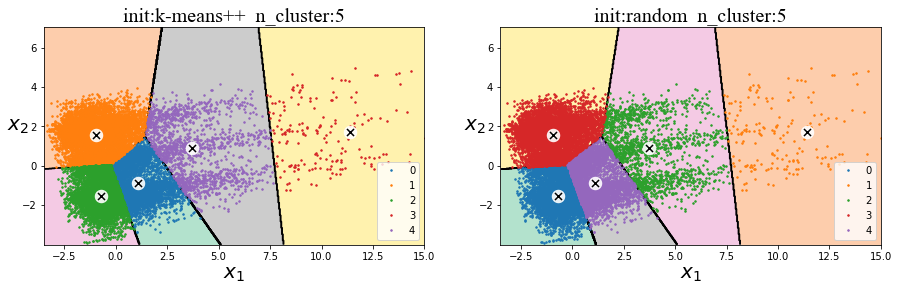

Saving figure distribution of K-means: 5 clusters


<Figure size 432x288 with 0 Axes>

In [35]:
plt.figure(figsize=(15, 4))
plt.subplot(121)
labels = km1.labels_
plot_decision_boundaried(km1, housing_PCA_scaled, tag=labels)
plt.xlim(-3.5, 15)
plt.subplot(122)
labels = km2.labels_
plot_decision_boundaried(km2, housing_PCA_scaled, tag=labels)
plt.xlim(-3.5, 15)
plt.show()
save_fig("distribution of K-means: 5 clusters")

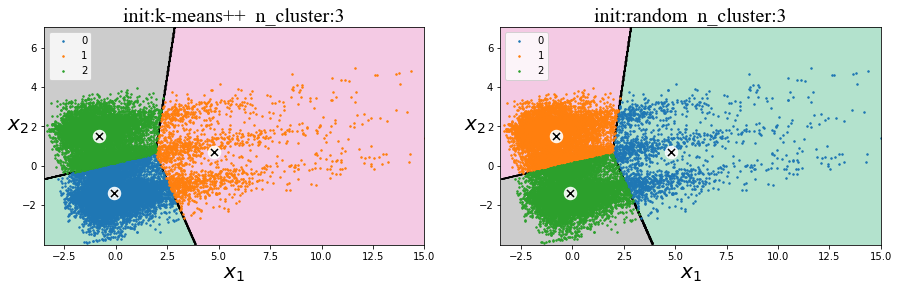

Saving figure distribution of K-means: 3 clusters


<Figure size 432x288 with 0 Axes>

In [36]:
plt.figure(figsize=(15, 4))
plt.subplot(121)
labels = km3.labels_
plot_decision_boundaried(km3, housing_PCA_scaled, tag=labels)
plt.xlim(-3.5, 15)
plt.subplot(122)
labels = km4.labels_
plot_decision_boundaried(km4, housing_PCA_scaled, tag=labels)
plt.xlim(-3.5, 15)
plt.show()
save_fig("distribution of K-means: 3 clusters")

I further visualized the results of the cluster, and the scatter points in the figure represent the original data downscaled to 2 dimensions by PCA. The black lines denotes the boundaries of different clusters, and the crossing marks denotes the center locations of each cluster. From the figure it can be claimed that the data on the left can be distinguished by whether its $x_2$ feature values are larger or not, as their x1 values are smaller. In contrast is the cluster on the right, their $x_1$ valus are larger, while the $x_2$ are more scattered and sparse in distribution.

In [37]:
housing_cluster.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,km1_label,km3_label
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,1,2
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,4,1
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,1,2


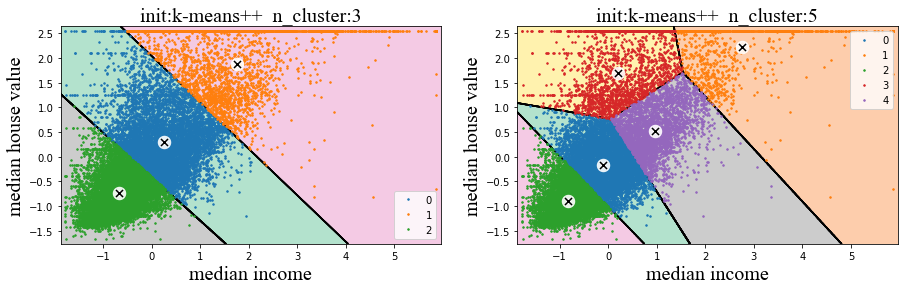

In [38]:
# in this section, choose only two features to do the K-means cluster:
scaler = StandardScaler()
housing_two_scaled = scaler.fit_transform(housing_cluster[['median_income','median_house_value']])

# Use k-means for clustering, set cluster=5, set different initialization methods ('k-means++' and 'random')
km_two_1 = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
# also use the cluster = 3
km_two_3 = KMeans(init='k-means++', n_clusters=3, n_init=10, random_state=42)

km_two_1.fit(housing_two_scaled)
km_two_3.fit(housing_two_scaled)

plt.figure(figsize=(15, 4))
plt.subplot(121)
labels = km_two_3.labels_
plot_decision_boundaried(km_two_3, housing_two_scaled, tag=labels)
plt.title("init:k-means++  n_cluster:3",font3)
plt.xlabel('median income',font3)
plt.ylabel('median house value',font3,rotation=90)
plt.subplot(122)
labels = km_two_1.labels_
plot_decision_boundaried(km_two_1, housing_two_scaled, tag=labels)
plt.title("init:k-means++  n_cluster:5",font3)
plt.xlabel('median income',font3)
plt.ylabel('median house value',font3,rotation=90)
plt.show()

In this section, I selected median income and local house prices as the merely two features for cluster analysis. The whole survey respondents was divided into 3 and 5 groups, where the bottom left group is the low income clan buying relatively low house prices. The top right scatter covers those who earn more and choose to buy quite expensive homes. The middle category reveals the distribution of those who earn a medium wage but buy expensive homes, those who earn a medium wage but buy relatively inexpensive homes, and so on. We can infer that the majority of people are willing to buy houses with medium or lower prices.

In [39]:
font2 = {'family' : 'Times New Roman', 'weight' : 'normal', 'size' : 15}

In [40]:
def get_marks(estimator, data, name=None, kmeans=None, af=None):
    """
    For the kmeans algorithm, there are five indices/evaluation factors in order to measure the performance of K-means
    
    :param estimator: model
    :param name: initialization method
    :param data: feature dataset
    """
    estimator.fit(data)
    print(20 * '*', name, 20 * '*')
    if kmeans:
        print("Mean Inertia Score: ", estimator.inertia_)
    elif af:
        cluster_centers_indices = estimator.cluster_centers_indices_
        print("The estimated number of clusters: ", len(cluster_centers_indices))
    print("Homogeneity Score: ", metrics.homogeneity_score(labels, estimator.labels_))
    print("Completeness Score: ", metrics.completeness_score(labels, estimator.labels_))
    print("V Measure Score: ", metrics.v_measure_score(labels, estimator.labels_))
    print("Adjusted Rand Score: ", metrics.adjusted_rand_score(labels, estimator.labels_))
    print("Adjusted Mutual Info Score: ", metrics.adjusted_mutual_info_score(labels, estimator.labels_))
    print("Calinski Harabasz Score: ", metrics.calinski_harabasz_score(data, estimator.labels_))
    print("Silhouette Score: ", metrics.silhouette_score(data, estimator.labels_))

def plot_scores(init, max_k, data, labels):

    i = []
    inertia_scores = []
    y_silhouette_scores = []
    y_calinski_harabaz_scores = []
    
    for k in range(2, max_k):
        kmeans_model = KMeans(n_clusters=k, random_state=1, init=init, n_init=10)
        pred = kmeans_model.fit_predict(data)
        i.append(k)
        inertia_scores.append(kmeans_model.inertia_)
        y_silhouette_scores.append(silhouette_score(data, pred))
        y_calinski_harabaz_scores.append(calinski_harabasz_score(data, pred))
    
    new = [inertia_scores, y_silhouette_scores, y_calinski_harabaz_scores]
    plt.figure()
    for j in range(len(new)):
        plt.figure(figsize=(6, 12))
        if j == 0:
            name = 'inertia'
            plt.subplot(311)
            plt.plot(i, new[j], color='#FF4500', marker='^', markersize=10, linewidth=3.3)
            plt.grid(True)
        elif j == 1:
            name = 'silhouette'
            plt.subplot(312)
            plt.plot(i, new[j], color='#00FF00',marker='o', markersize=10, linewidth=3.3)
            plt.grid(True)
        else:
            name = 'calinski_harabasz'
            plt.subplot(313)
            plt.plot(i, new[j], color='#00FFFF',marker='s', markersize=10, linewidth=3.3)
            plt.grid(True)
            plt.xlabel('n_clusters', font3)
        plt.ylabel('{}'.format(name),font2)
        plt.title('{}_scores with {} init'.format(name, init),font2)
        
    save_fig('various scores')

In [41]:
labels = km1.labels_
get_marks(km1, housing_PCA_scaled, name="k-means++", kmeans=True)
labels = km3.labels_
get_marks(km3, housing_PCA_scaled, name="k-means++", kmeans=True)

******************** k-means++ ********************
Mean Inertia Score:  32252.74814253064
Homogeneity Score:  1.0
Completeness Score:  1.0
V Measure Score:  1.0
Adjusted Rand Score:  1.0
Adjusted Mutual Info Score:  1.0
Calinski Harabasz Score:  16589.088829015956
Silhouette Score:  0.42226514113650115
******************** k-means++ ********************
Mean Inertia Score:  51382.891838767275
Homogeneity Score:  1.0
Completeness Score:  1.0
V Measure Score:  1.0
Adjusted Rand Score:  1.0
Adjusted Mutual Info Score:  1.0
Calinski Harabasz Score:  16986.013906930064
Silhouette Score:  0.47525631811921937


Saving figure various scores


<Figure size 432x288 with 0 Axes>

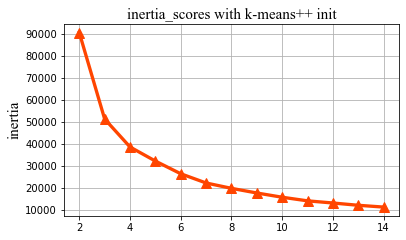

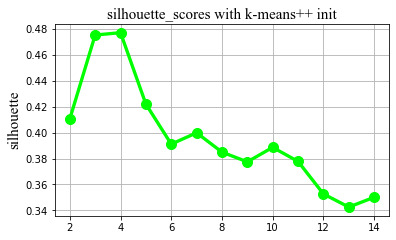

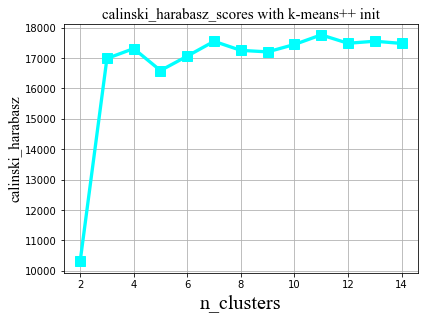

In [42]:
plot_scores('k-means++',15, housing_PCA_scaled, km3.labels_)

In the final part of K-means cluster analysis, I am going to measure clustering performances when there are no ground truth with our data. These measurement can help us to determine the best partition and optimal cluster number of a set of objects. I predominantly use three scores as the foundation of our evaluations: inertial score, Silhouette coefficient and Calinski-Harabasz coefficient.

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1. The Calinski-Harabasz score, also known as the Variance Ratio Criterion, is defined as ratio between the within-cluster dispersion and the between-cluster dispersion. The higher the score, the better the performances.

It can be seen that most of the scores show a single trend of change as the number of clusters increases. However, in the change of the Silhoutte coefficient, we see a peak when the cluster is 3 and 4, which proves that if we investigate the compactness of the cluster, the best results are obtained when the cluster is 3 or 4. The mean Silhoutte coefficient reaches 0.47 in the overall analysis, which is quite an awesome classification results. 

# Housing Prices Prediction

In the next analysis, I focus on the house price prediction with different machine learning methods and measure the error by the mean square error calculations. But the very first step is to generate the relevant training and testing data set accordingly.

## 1. Training and Testing data Creation 

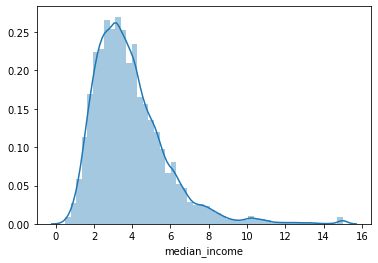

In [43]:
housing.drop(['ocean_proximity'],axis=1,inplace=True)
sns.distplot(housing.median_income)

In [44]:
housing.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,total_income,total_house_price,median_house_value_log
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,2680.7144,57027600.0,13.022766
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,19931.6614,407973000.0,12.789687
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,3599.6704,62321700.0,12.771673


In [57]:
housing.drop(['total_income','total_house_price','median_house_value_log'],axis=1,inplace=True)
housing.head(3)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,income_cat
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,0,0,0,1,0,5.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,0,0,0,1,0,5.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,0,0,0,1,0,5.0


/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1840: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


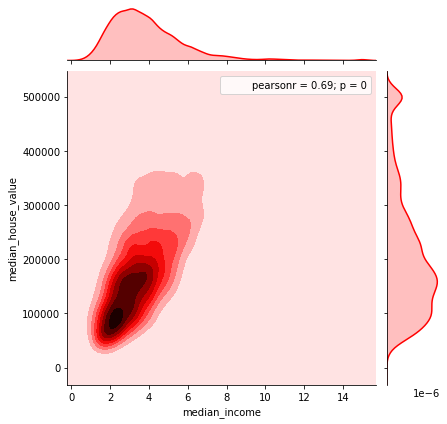

In [58]:
j = sns.jointplot(x='median_income',y='median_house_value',data=housing,color='red',kind='kde')
j.annotate(stats.pearsonr)
plt.show()

Stratified sampling rather than random sampling is used for machine learning analysis is because make sure that the test set is a good representation of the overall population and the population is devided into homogeneous subgroups called strata and the correct instances are sampled from each stratum. It is clear that the number of people with salary and income levels between the averages is the largest, and we expect the test set to reflect this nature well.

I limit the number of categories by dividing the median income by 1.5 and merge all the income greater than 5 into 5.

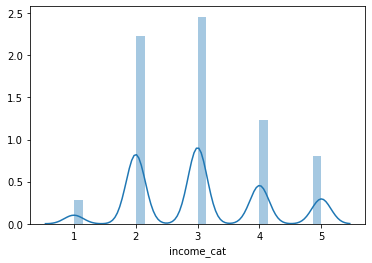

In [59]:
housing['income_cat'] = np.ceil(housing['median_income']/1.5)
housing['income_cat'].where(housing['income_cat']<5, 5.0, inplace=True)
sns.distplot(housing.income_cat)

In [60]:
# stratified sampling based on income categories
from sklearn.model_selection import StratifiedShuffleSplit
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(housing, housing['income_cat']):
    strat_train_set = housing.loc[train_index]
    strat_test_set = housing.loc[test_index]
strat_test_set.head(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,income_cat
5241,-118.39,34.12,29.0,6447.0,1012.0,2184.0,960.0,8.2816,500001.0,1,0,0,0,0,5.0
10970,-117.86,33.77,39.0,4159.0,655.0,1669.0,651.0,4.6111,240300.0,1,0,0,0,0,4.0
20351,-119.05,34.21,27.0,4357.0,926.0,2110.0,876.0,3.0119,218200.0,1,0,0,0,0,3.0
6568,-118.15,34.20,52.0,1786.0,306.0,1018.0,322.0,4.1518,182100.0,0,1,0,0,0,3.0
13285,-117.68,34.07,32.0,1775.0,314.0,1067.0,302.0,4.0375,121300.0,0,1,0,0,0,3.0


We can compare the different sampling results for the test set by comparing them to the overall population distribution as follows. Stratified sampling's distributions are much more similar to the overall distributions.

In [61]:
housing['income_cat'].value_counts() / len(housing)

3.0    0.350581
2.0    0.318847
4.0    0.176308
5.0    0.114438
1.0    0.039826
Name: income_cat, dtype: float64

In [62]:
strat_test_set['income_cat'].value_counts() / len(strat_test_set)

3.0    0.350533
2.0    0.318798
4.0    0.176357
5.0    0.114583
1.0    0.039729
Name: income_cat, dtype: float64

In [63]:
strat_train_set.drop(['income_cat'],axis=1,inplace=True)
strat_test_set.drop(['income_cat'],axis=1,inplace=True)

In [64]:
X_train = strat_train_set.drop(['median_house_value'],axis=1)
X_test = strat_test_set.drop(['median_house_value'],axis=1)
y_train = strat_train_set["median_house_value"]
y_test = strat_test_set["median_house_value"]

x_train=scaler.fit_transform(X_train)
x_test=scaler.fit_transform(X_test)

## 2. Different Machine Learning Methods 

Now we are ready to train a model and predict the required solution. I tried seven machine learning methods in total: Linear Regression, Decision Tree Regressor, Random Forest, Ridge Regression, Bagging Regression, MLPRegressor and AdaBoost Regressor. I first briefly look at the test set and training set scores and rmse of each model and then select the best optimal model for hyperparameter tuning by the gridsearch method. 

The score of every model returns the coefficient of determination  of the prediction. The coefficient $R^2$ is defined as $(1-\frac{u}{v})$, where $u$ is the residual sum of squares ((y_true - y_pred) ** 2).sum() and  is the total sum of squares ((y_true - y_true.mean()) ** 2).sum(). The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that always predicts the expected value of y, disregarding the input features, would get a $R^2$ score of 0.0.

### 2.1 Linear Regression 

Linear Regression is a linear approach to modeling the relationship between a scalar response (or dependent variable) and one or more explanatory variables (or independent variables). The case of one explanatory variable is called simple linear regression. For more than one explanatory variable, the process is called multiple linear regression. 

In [65]:
lin_reg=LinearRegression()
lin_reg.fit(x_train,y_train)

y_pred=lin_reg.predict(x_train)
lin_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
lin_train_score = lin_reg.score(x_train, y_train)
print('The score of training data set is', lin_train_score)
print('The mean square error of training data set is', lin_train_rmse)

print('\n')

y_pred=lin_reg.predict(x_test)
lin_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
lin_test_score = lin_reg.score(x_test, y_test)
print('The score of training data set is', lin_test_score)
print('The mean square error of testing data set is', lin_test_rmse)

The score of training data set is 0.6438007634117917
The mean square error of training data set is 69052.27894421273


The score of training data set is 0.6512933286715468
The mean square error of testing data set is 67410.83476214352


### 2.2 Decision Tree Regression 

This model uses a Decision Tree as a predictive model which maps features (tree branches) to conclusions about the target value (tree leaves). Tree models where the target variable can take a finite set of values are called classification trees; in these tree structures, leaves represent class labels and branches represent conjunctions of features that lead to those class labels. Decision trees where the target variable can take continuous values (typically real numbers) are called regression trees

In [66]:
tree_reg = DecisionTreeRegressor()
tree_reg.fit(x_train,y_train)

y_pred=tree_reg.predict(x_train)
tree_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
tree_train_score = tree_reg.score(x_train, y_train)
print('The score of training data set is', tree_train_score)
print('The mean square error of training data set is', tree_train_rmse)

print('\n')

y_pred=tree_reg.predict(x_test)
tree_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
tree_test_score = tree_reg.score(x_test, y_test)
print('The score of testing data set is', tree_test_score)
print('The mean square error of testing data set is', tree_test_rmse)

The score of training data set is 1.0
The mean square error of training data set is 0.0


The score of testing data set is 0.5563359232202589
The mean square error of testing data set is 76037.303966043


### 2.3 Random Forest  

Random Forest is one of the most popular model. Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks, that operate by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. 

In [67]:
forest_reg = RandomForestRegressor()
forest_reg.fit(x_train,y_train)

y_pred=forest_reg.predict(x_train)
forest_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
forest_train_score = forest_reg.score(x_train, y_train)
print('The score of training data set is', forest_train_score)
print('The mean square error of training data set is', forest_train_rmse)

print('\n')

y_pred=forest_reg.predict(x_test)
forest_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
forest_test_score = forest_reg.score(x_test, y_test)
print('The score of testing data set is', forest_test_score)
print('The mean square error of testing data set is', forest_test_rmse)

The score of training data set is 0.9744037428947837
The mean square error of training data set is 18510.56845359455


The score of testing data set is 0.7756070274663868
The mean square error of testing data set is 54075.9556104561


### 2.4 Ridge Regression 

Ridge Regression is the most commonly used regression algorithm to approximate an answer for an equation with no unique solution. This type of problem is very common in machine learning tasks, where the "best" solution must be chosen using limited data. 

In [68]:
ridge = RidgeCV(cv=5)
ridge.fit(x_train,y_train)

y_pred=ridge.predict(x_train)
ridge_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
ridge_train_score = ridge.score(x_train, y_train)
print('The score of training data set is', ridge_train_score)
print('The mean square error of training data set is', ridge_train_rmse)

print('\n')

y_pred=ridge.predict(x_test)
ridge_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
ridge_test_score = ridge.score(x_test, y_test)
print('The score of testing data set is', ridge_test_score)
print('The mean square error of testing data set is', ridge_test_rmse)

The score of training data set is 0.6437945106555116
The mean square error of training data set is 69052.88501678625


The score of testing data set is 0.6512711917461107
The mean square error of testing data set is 67412.97444724673


### 2.5 Bagging Regression 

Bootstrap aggregating, also called Bagging, is a machine learning ensemble meta-algorithm designed to improve the stability and accuracy of machine learning algorithms used in statistical classification and regression. It also reduces variance and helps to avoid overfitting. 

In [69]:
bagging = BaggingRegressor()
bagging.fit(x_train,y_train)

y_pred=bagging.predict(x_train)
bagging_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
bagging_train_score = bagging.score(x_train, y_train)
print('The score of training data set is', bagging_train_score)
print('The mean square error of training data set is', bagging_train_rmse)

print('\n')

y_pred=bagging.predict(x_test)
bagging_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
bagging_test_score = bagging.score(x_test, y_test)
print('The score of testing data set is', bagging_test_score)
print('The mean square error of testing data set is', bagging_test_rmse)

The score of training data set is 0.9635902972716273
The mean square error of training data set is 22077.00167641527


The score of testing data set is 0.7486488154969881
The mean square error of testing data set is 57232.147900624725


### 2.6 MLPRegressor  

The MLPRegressor optimizes the squared-loss using LBFGS or stochastic gradient descent by the Multi-layer Perceptron regressor. We use grid search first here because we want to make it more accurate with more hidden layer size, otherwise the accuracy of this model would be randomly small.

In [70]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
mlp = MLPRegressor()
param_grid = {'hidden_layer_sizes': [i for i in range(5,10)],
              'activation': ['relu'],
              'solver': ['adam'],
              'learning_rate': ['constant'],
              'learning_rate_init': [0.01],
              'power_t': [0.5],
              'alpha': [0.0001]}
mlp_GS = GridSearchCV(mlp, param_grid=param_grid, cv=10, verbose=True, pre_dispatch='2*n_jobs')
mlp_GS.fit(x_train,y_train)

y_pred=mlp_GS.predict(x_train)
mlp_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
mlp_train_score = mlp_GS.score(x_train, y_train)
print('The score of training data set is', mlp_train_score)
print('The mean square error of training data set is', mlp_train_rmse)

print('\n')

y_pred=mlp_GS.predict(x_test)
mlp_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
mlp_test_score = mlp_GS.score(x_test, y_test)
print('The score of testing data set is', mlp_test_score)
print('The mean square error of testing data set is', mlp_test_rmse)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (

/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/m

The score of training data set is 0.47170226237839485
The mean square error of training data set is 84095.14030963134


The score of testing data set is 0.4688606961732945
The mean square error of testing data set is 83196.25876311932


/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


### 2.7 AdaBoost Regressor  

The core principle of AdaBoost is to fit a sequence of weak learners (i.e., models that are only slightly better than random guessing, such as small decision trees) on repeatedly modified versions of the data. The predictions from all of them are then combined through a weighted majority vote (or sum) to produce the final prediction. 

In [71]:
from sklearn.ensemble import AdaBoostRegressor
Ada_Boost = AdaBoostRegressor()
Ada_Boost.fit(x_train,y_train)

y_pred=Ada_Boost.predict(x_train)
adaboost_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
adaboost_train_score = Ada_Boost.score(x_train, y_train)
print('The score of training data set is', adaboost_train_score)
print('The mean square error of training data set is', adaboost_train_rmse)

print('\n')

y_pred=Ada_Boost.predict(x_test)
adaboost_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
adaboost_test_score = Ada_Boost.score(x_test, y_test)
print('The score of testing data set is', adaboost_test_score)
print('The mean square error of testing data set is', adaboost_test_rmse)

The score of training data set is 0.37545513062392677
The mean square error of training data set is 91435.18471319007


The score of testing data set is 0.3582591003353638
The mean square error of testing data set is 91449.10014885465


## 3. Model Comparison 

In [72]:
train_score = [lin_train_score, tree_train_score, forest_train_score, ridge_train_score, bagging_train_score, mlp_train_score, adaboost_train_score]
test_score = [lin_test_score, tree_test_score, forest_test_score, ridge_test_score, bagging_test_score, mlp_test_score, adaboost_test_score]
train_rmse = [lin_train_rmse, tree_train_rmse, forest_train_rmse, ridge_train_rmse, bagging_train_rmse, mlp_train_rmse, adaboost_train_rmse]
test_rmse = [lin_test_rmse, tree_test_rmse, forest_test_rmse, ridge_test_rmse, bagging_test_rmse, mlp_test_rmse, adaboost_test_rmse]

In [73]:
models = pd.DataFrame({
    'Model': ['Linear Regression', 'Decision Tree Regressor', 'Random Forest', 'RidgeRegressor', 'BaggingRegressor', 
              'MLPRegressor', 'AdaBoostRegressor'],
    
    'train score': train_score,
    'test score': test_score,
    'train rmse': train_rmse,
    'test rmse': test_rmse
                     })

In [74]:
models

,Model,train score,test score,train rmse,test rmse
0,Linear Regression,0.643801,0.651293,69052.278944,67410.834762
1,Decision Tree Regressor,1.000000,0.556336,0.000000,76037.303966
2,Random Forest,0.974404,0.775607,18510.568454,54075.955610
3,RidgeRegressor,0.643795,0.651271,69052.885017,67412.974447
4,BaggingRegressor,0.963590,0.748649,22077.001676,57232.147901
5,MLPRegressor,0.471702,0.468861,84095.140310,83196.258763
6,AdaBoostRegressor,0.375455,0.358259,91435.184713,91449.100149


It turns out that the Random Forest winns out among all the other models!! I will go further with that algorithms and tune the hyperparameter with grid search CV. 

## 4. Hyperparameter Tune 

Let's find out what parameters could be tuned for us:

In [94]:
forest_reg.get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [102]:
# use GridSearch to find best hyperparameter combinations
from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators':[3, 10, 30], 'max_features': [2, 4, 6, 8]},  # try 3x4=12 combinations
    {'bootstrap': [False], 'n_estimators':[3, 10], 'max_features': [2, 3, 4]},  # try 2x3=6 combinations
]

forest_reg = RandomForestRegressor()
grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error')  # each model is trained 5 times, so (12+6)*5 = 80 rounds of training in total
grid_search.fit(x_train,y_train)
grid_search.best_params_  # best parameters

{'max_features': 6, 'n_estimators': 30}

In [103]:
grid_search.best_estimator_  # best estimators

RandomForestRegressor(max_features=6, n_estimators=30)

In [104]:
best_grid = grid_search.best_estimator_ 
best_grid.fit(x_train,y_train)

y_pred=best_grid.predict(x_train)
best_train_rmse=np.sqrt(mean_squared_error(y_train, y_pred))
best_train_score = best_grid.score(x_train, y_train)
print('The score of training data set is', best_train_score)
print('The mean square error of training data set is', best_train_rmse)

print('\n')

y_pred=best_grid.predict(x_test)
best_test_rmse=np.sqrt(mean_squared_error(y_test, y_pred))
best_test_score = best_grid.score(x_test, y_test)
print('The score of testing data set is', best_test_score)
print('The mean square error of testing data set is', best_test_rmse)

The score of training data set is 0.9721746679206363
The mean square error of training data set is 19299.75083221955


The score of testing data set is 0.7908882548462199
The mean square error of testing data set is 52202.19808143464


We can see that the random forest model using grid search has improved in terms of accuracy.

In [105]:
test = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})

In [106]:
test

,Predicted,Actual
5241,475903.933333,500001.0
10970,271153.333333,240300.0
20351,216956.666667,218200.0
6568,234123.333333,182100.0
13285,148040.000000,121300.0
...,...,...
20519,91996.666667,76400.0
17430,131570.000000,134000.0
4019,255323.333333,311700.0
12107,162940.000000,133500.0


Text(0, 0.5, 'Actual/Predicted Value')

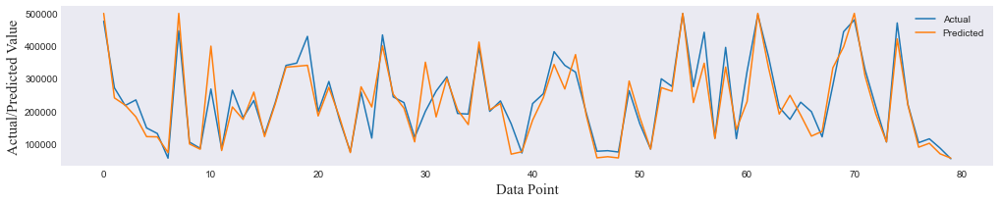

In [285]:
fig= plt.figure(figsize=(17,3))
plt.style.use('seaborn-dark')
test = test.reset_index()
test = test.drop(['index'],axis=1)
plt.plot(test[:80])
plt.legend(['Actual','Predicted'])
plt.xlabel("Data Point",font2)
plt.ylabel("Actual/Predicted Value",font2)

/Users/mengshuai/opt/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:1840: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


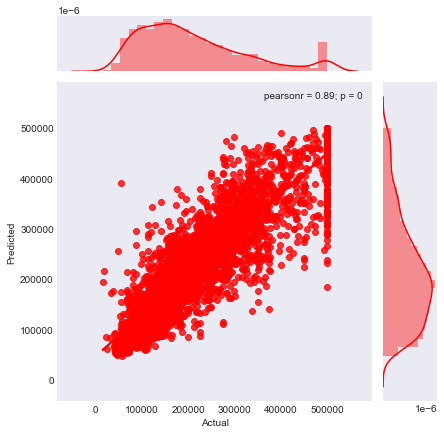

In [164]:
j = sns.jointplot(x='Actual',y='Predicted',data=test, kind='reg',color='red')
j.annotate(stats.pearsonr)
plt.show()

The above graph reflects the variation between the predicted and true values, and we can see that the error between the predicted and true values using the random forest model is quite trivial, with a root mean square of 52200 and the correlation between the two is very strong, with a correlation coefficient of 0.89.

# Conclusion

1. The median house price is proportional to the median income of local residents with a correlation of 0.69. However, the coefficient between the total income of a certain region and the corresponding median house price is only 0.27. The main reason for this is that the total house price would also be affected by the population of a region.
2. The age is divided into two groups: >30 and <30. It can be obtained that two groups are more representative of the age of 40 and 18, where the actual median income of the older group is not as high as that of the younger group, but the house they purchased has a higher value. 
3. The distance to the ocean matters when considering the housing prices. The closer the house is to the sea and the coast, the higher its price will reach.
4. The population distribution is not the most along the sea shore but relatively evenly distributed. The population is generally larger in the south than in the north, while the age is reversely distributed.
5. The data can be divided into 3-5 clusters by elbow methods. The representative age of the first category is 16 years old, and they have the largest median income and population. Their houses are mainly located inland as well as on the coast. The second group is the middle-aged group with the largest age but relatively small population. Although their wages are not the largest in these three groups, they have the highest house prices to purchase. The last group has the lowest wage and the lowest house price, and most of their houses are built inland. 
6. In the variation figure of the Silhoutte coefficient, a peak of 3 and 4 clusters can be seen, which proves that if we investigate the compactness of the cluster, the best results are obtained when the cluster is 3 or 4. The mean Silhoutte coefficient of our model is 0.475, mean inertial score is 51382 and mean Calinski score is 16986. Different initialization methods have no effect on the cluster analysis.
7. The random forest algorithm outperformed six other machine learning methods in predicting house prices. The score of training data and testing data is 0.974 and 0.775, and mean square error is 18510 and 54075 respectively.
8. After applying gridsearch method to random forest algorithm, the accuracy of testing data improved 2% and error decreased 3.58% and the correlation coefficient between the predicted and true values of house prices reached 0.89.